In [2]:
cd((@__DIR__) * raw"\..")
include("../table_reader.jl")
include("../utils/Missing_values.jl")

ImputeMissingValues!

In [3]:
series=extract_series("TX_STAID000737.txt",plot=false)
series=truncate_MV(series,"TX")
years=unique(Dates.year.(series.DATE))

include("../utils/Simulation.jl")
Days_list=GatherYearScenario(series[!,2],series.DATE)
avg_day=mean.(Days_list)
max_day=maximum.(Days_list)
df_month = @chain series begin
    @transform(:TEMP = series[!,2]) #Give a common name for TX, TN, etc...
    @transform(:MONTH = month.(:DATE)) #add month column
    @by(:MONTH, :MONTHLY_MEAN = mean(:TEMP), :MONTHLY_STD = std(:TEMP), :MONTHLY_MAX = maximum(:TEMP)) # grouby MONTH + takes the mean/std in each category 
end

include("../utils/Structure.jl")
Caracteristics_Series = init_CaracteristicsSeries(series)

CaracteristicsSeries([5.60864197530864, 6.0851851851851855, 5.533333333333336, 5.366666666666668, 5.716049382716051, 5.77283950617284, 5.401234567901235, 5.356790123456789, 5.698765432098765, 5.741975308641975  …  6.827160493827159, 6.672839506172841, 6.477777777777779, 6.506172839506172, 6.359259259259259, 5.904938271604939, 5.898765432098763, 5.862962962962962, 5.881481481481482, 5.590123456790123], [14.3, 13.9, 13.1, 13.4, 13.4, 14.7, 13.5, 13.4, 14.5, 13.2  …  14.1, 14.2, 13.2, 14.4, 13.8, 13.1, 14.2, 14.2, 16.0, 16.1], 12×4 DataFrame
 Row │ MONTH  MONTHLY_MEAN  MONTHLY_STD  MONTHLY_MAX 
     │ Int64  Float64       Float64      Float64     
─────┼───────────────────────────────────────────────
   1 │     1       5.72561      4.27158         15.2
   2 │     2       6.92369      4.30074         19.0
   3 │     3      10.4113       4.13513         24.8
   4 │     4      13.9756       4.33257         27.9
   5 │     5      17.7996       4.37329         31.7
   6 │     6      20.7504   

# AR(1)

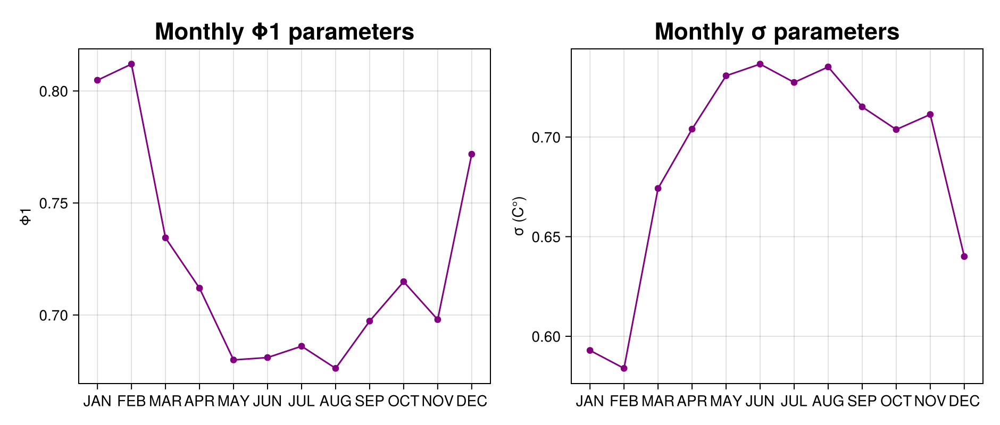

In [4]:
include(raw"..\utils\Structure.jl")
Model = fit_AR(series[:,2],series.DATE,p=1)
PlotMonthlyparams([invert(Model.Φ) ; [Model.σ]])

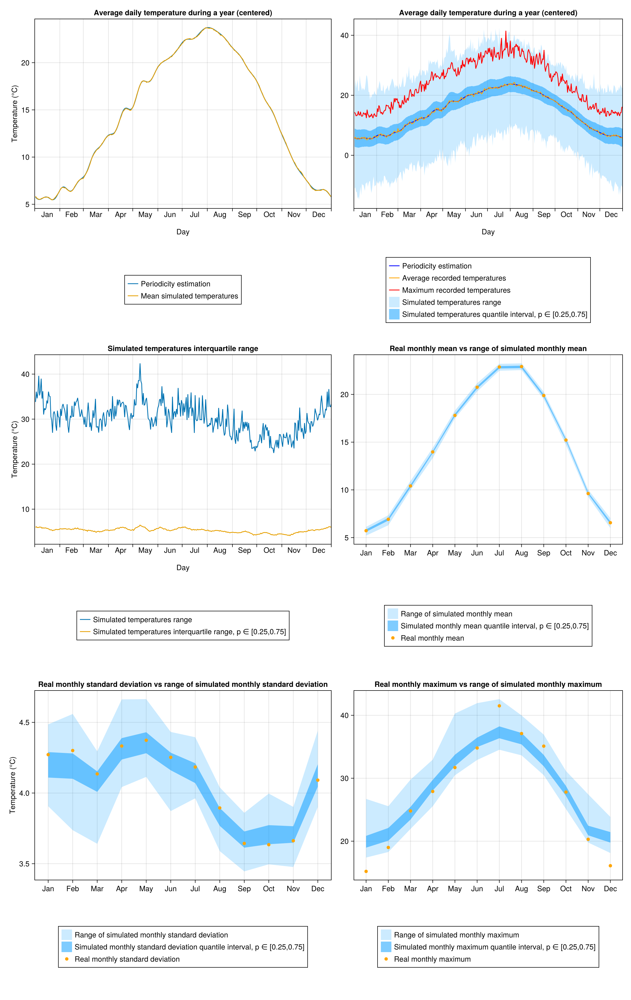

In [5]:
sample_ = rand(Model, 100, series.DATE)
Sample_diagnostic(sample_, series.DATE, Model.period .+ mean(Model.trend), avg_day, max_day, df_month, format_ = "vertical")

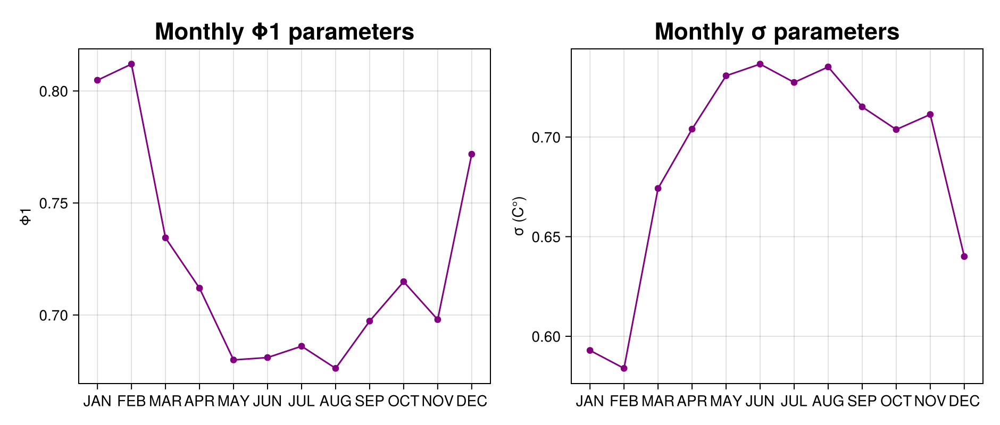

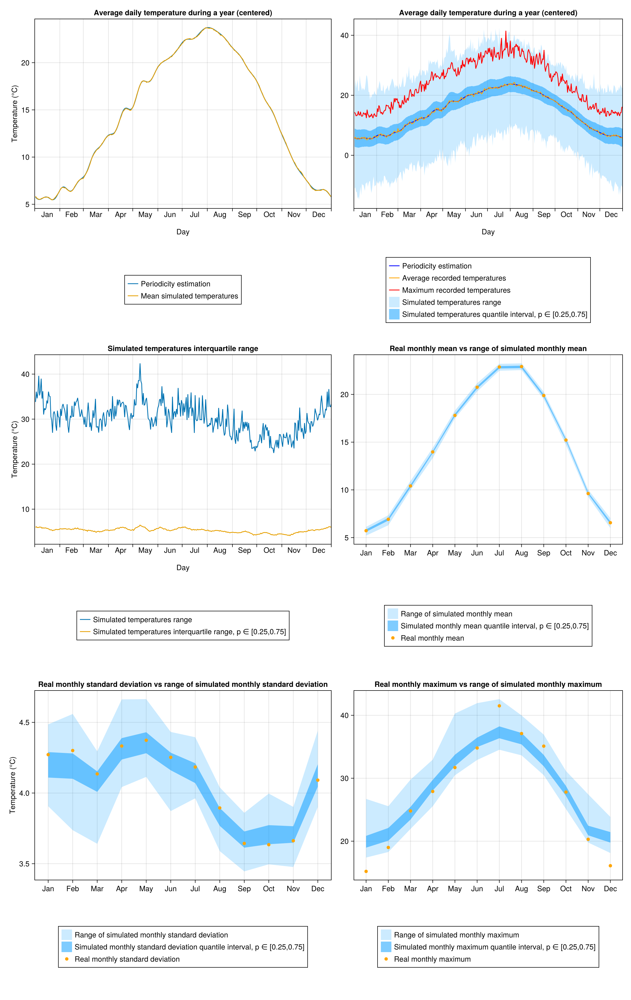

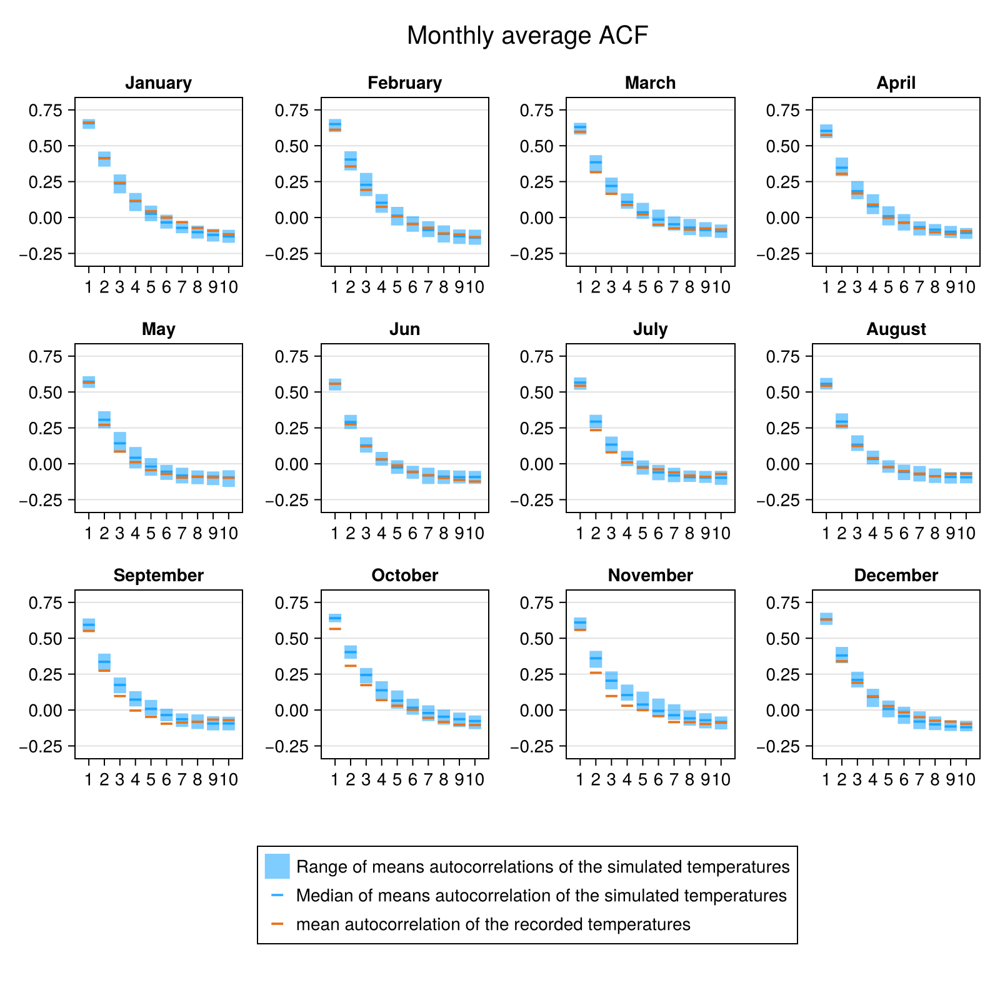

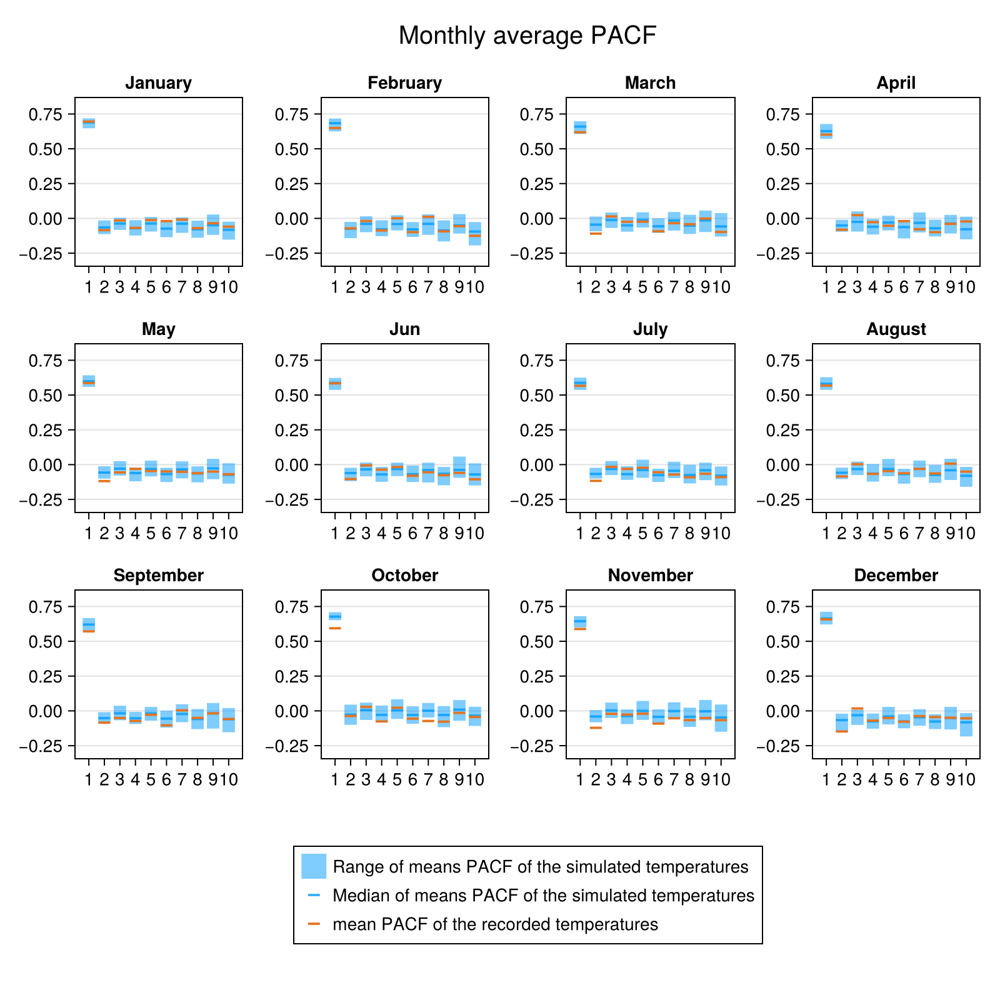

(CairoMakie.Screen{CairoMakie.IMAGE}(Scene (940px, 400px):
  0 Plots
  2 Child Scenes:
    ├ Scene (940px, 400px)
    └ Scene (940px, 400px), Cairo.CairoSurfaceImage{ColorTypes.ARGB32}(Ptr{Nothing} @0x000002bf839c5560, 1880.0, 800.0, ColorTypes.ARGB32[ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) … ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8); ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) … ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8); … ; ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) … ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8); ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) … ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8)]), Cairo.CairoContext(Ptr{Nothing} @0x000002b

In [8]:
include("../utils/Plotting.jl")
display.(Sample_diagnostic(sample_,Caracteristics_Series,Model))

# AR(2)

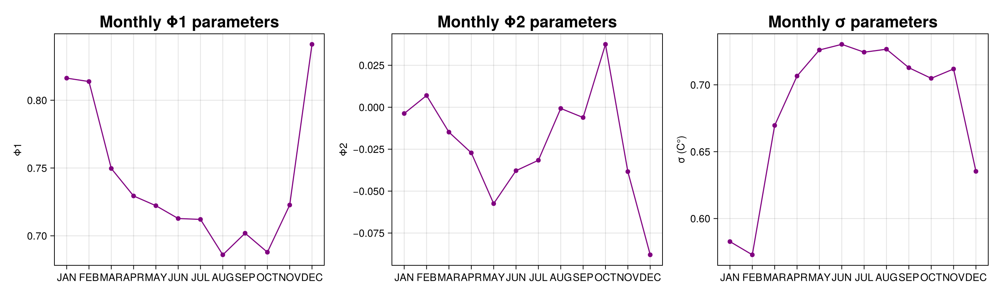

In [21]:
include(raw"..\utils\Structure.jl")
Model2 = fit_AR(series[:,2],series.DATE,p=2)
PlotMonthlyparams([invert(Model2.Φ) ; [Model2.σ]])

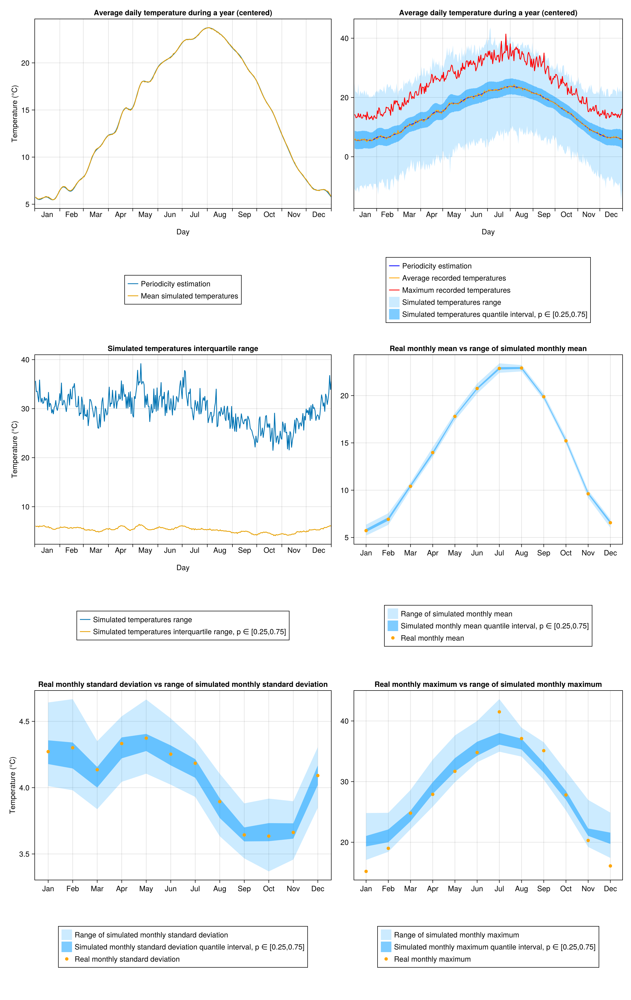

In [22]:
sample_ = rand(Model2, 100, series.DATE[1]:series.DATE[end])
Sample_diagnostic(sample_, series.DATE, Model2.period .+ mean(Model2.trend), avg_day, max_day, df_month, format_ = "vertical")